In [1]:
import pandas as pd
import geopandas as gpd
import osmnx as ox
import networkx as nx
import glob
from city import City
import matplotlib.pyplot as plt
import contextily as cx

/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/geopandas/_compat.py:112: UserWarning: The Shapely GEOS version (3.8.0-CAPI-1.13.1 ) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.
  warnings.warn(


In [2]:
# Return a Nx netowrk, edges Gdf and nodes gdf
def network_based_on_polygon(polygon, network_type = 'all', street_types = 'all', simplify = True):
    ox.settings.timeout = 600
    
    if street_types == 'all':
        custom_filter = None
    else:
        sep = '|'
        custom_filter = f'["highway"~"{sep.join(street_types)}"]'

    if polygon.geom_type == 'Polygon':
        G = ox.graph.graph_from_polygon(polygon, network_type = network_type, simplify = True, retain_all = True, clean_periphery = False, custom_filter=custom_filter)
        G = ox.utils_graph.get_undirected(G)
    elif polygon.geom_type == 'MultiPolygon':
        nets = []
        for p in polygon:
            G_aux = ox.graph.graph_from_polygon(p, network_type = network_type, simplify = True, retain_all = True, clean_periphery = False, custom_filter=custom_filter)
            G_aux = ox.utils_graph.get_undirected(G_aux)
            nets.append(G_aux)
        G = nx.compose(*nets)

    network = G.copy()
    nodes = ox.graph_to_gdfs(G, edges=False)
    edges = ox.graph_to_gdfs(G, nodes=False).reset_index()
    nodes.rename(columns={"street_count": "st_count"}, inplace = True)
    edges = edges.explode(index_parts=True).reset_index(drop = True)
    return edges

In [3]:
nets = ['primary', 'secondary', 'trunk', 'motorway']
pwd = "/Volumes/CNN4DCM/Repo/urban_behavior/zones"
city_folders = glob.glob(f"{pwd}/*")
collected_nets = {}
for c in city_folders:
    city = City(c, True, False, True, boundary = True, edges = True)
    crs = city.crs
    bound = city.boundary
    polygon = bound.unary_union
    try:
        df_net = network_based_on_polygon(polygon, network_type = 'all', street_types = nets, simplify = True)
        collected_nets[c.split('/')[-1]] = [df_net, bound, city.edges, crs]
        print(f"ready {c.split('/')[-1]}")
    except:
        continue

final_geoms = []
for i in range(0, len(list(collected_nets.keys()))):
    place = list(collected_nets.keys())[i]
    collected_nets[place][0]['highway_ok'] = collected_nets[place][0].apply(lambda row: row['highway'] if not type(row['highway']) is list else row['highway'][0], axis = 1)
    crs = collected_nets[place][3]
    collected_nets[place].append(collected_nets[place][0].to_crs(crs))    
    collected_nets[place][4]['geometry'] = collected_nets[place][4].apply(lambda row: row['geometry'].buffer(35) if row['highway_ok'] in ['trunk', 'motorway'] else row['geometry'].buffer(25), axis = 1)
    collected_nets[place][4] = collected_nets[place][4].to_crs(4326)
    #collected_nets[place][4]['new_column'] = 0
    #collected_nets[place][4] = collected_nets[place][4].dissolve(by='new_column')
    final_geoms.append(collected_nets[place][4].copy())

/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Lochem_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Westvoorne_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Altena_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Loppersum_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Eindhoven_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Epe_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Staphorst_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Waterland_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Roermond_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Aa en Hunze_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Ermelo_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Renkum_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Etten-Leur_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Haarlem_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Noordenveld_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Nijmegen_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Hillegom_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Capelle aan den IJssel_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Hellevoetsluis_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Montfoort_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Neder-Betuwe_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Beuningen_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Barendrecht_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Middelburg_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Voorschoten_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Duiven_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Mook en Middelaar_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Hilversum_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Rucphen_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Hoogeveen_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Koggenland_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Bergeijk_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Enschede_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Medemblik_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Vught_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Diemen_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Schouwen-Duiveland_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Zutphen_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Heerenveen_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)
/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Amsterdam_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Teylingen_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Beek_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Gulpen-Wittem_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Cuijk_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Bergen (NH)_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Doesburg_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Lisse_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Dalfsen_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Oude IJsselstreek_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Kapelle_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Albrandswaard_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Coevorden_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Roerdalen_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Almere_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Rijswijk_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Enkhuizen_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Uden_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Geertruidenberg_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Krimpen aan den IJssel_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Cranendonck_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Ede_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Weert_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Gilze en Rijen_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Zwartewaterland_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Utrechtse Heuvelrug_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Best_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Achtkarspelen_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Sittard-Geleen_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Velsen_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Landsmeer_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Westerkwartier_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Zandvoort_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Bunnik_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Heeze-Leende_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Steenwijkerland_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Den Helder_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Ouder-Amstel_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Dinkelland_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Leeuwarden_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Opmeer_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Beekdaelen_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Aalsmeer_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Haarlemmermeer_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Zeewolde_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Schiedam_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Veendam_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Molenlanden_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Rheden_NL


/Users/francisco/.pyenv/versions/3.9.13/envs/phd/lib/python3.9/site-packages/osmnx/graph.py:478: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  warnings.warn(msg)


ready Westerveld_NL


In [5]:
gdf_final = pd.concat(final_geoms)
gdfff = gdf_final.loc[:,['geometry', 'highway_ok']]

In [6]:

gdfff.to_file('highways.shp')
gdfff.to_file('highways.geojson')

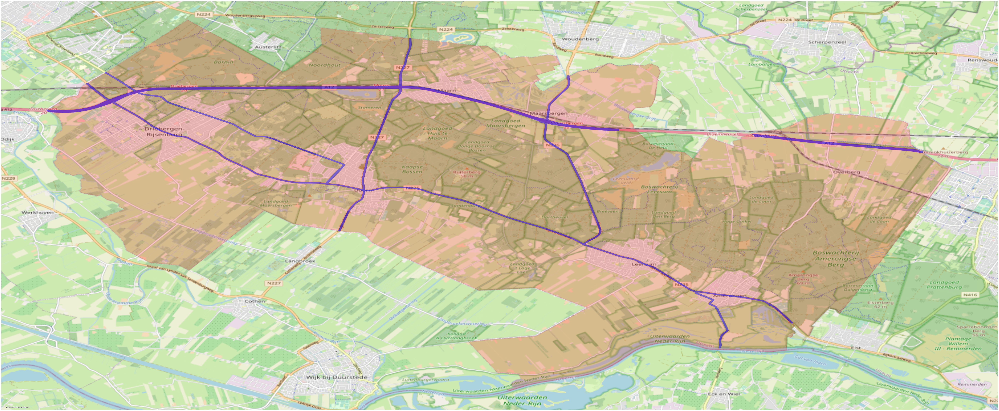

In [7]:
place = list(collected_nets.keys())[1]

fig, ax = plt.subplots(figsize=(100,100))
collected_nets[place][4].plot(ax = ax, zorder = 4, color = 'blue', alpha = 0.5) #legend = True, legend_kwds = {'fontsize': 80, 'markerscale': 8, 'loc':'lower left'}, alpha = 0.8)
#collected_nets[place][0].plot(ax = ax, zorder = 3, column = 'highway_ok', linewidth = 20, legend = True, legend_kwds = {'fontsize': 80, 'markerscale': 8, 'loc':'lower left'})
#collected_nets[place][2].plot(ax = ax, zorder = 2, linewidth = 2, color = 'purple')
collected_nets[place][1].plot(ax = ax, zorder = 1, color = 'red', alpha = 0.2)
cx.add_basemap(ax, source=cx.providers.OpenStreetMap.Mapnik, crs = collected_nets[place][1].crs, zorder = 0, alpha = 1)
plt.axis('off')
plt.show()

In [9]:
gdfff['highway_ok'].value_counts()

secondary         8376
primary           5261
motorway_link     1501
motorway          1161
trunk              644
primary_link       514
trunk_link         361
secondary_link     352
Name: highway_ok, dtype: int64